# Setup

In [491]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib.request
import matplotlib as mpl
import matplotlib.font_manager as font_manager
urllib.request.urlretrieve('https://github.com/google/fonts/raw/main/ofl/ibmplexmono/IBMPlexMono-Regular.ttf', 'IBMPlexMono-Regular.ttf')
fe = font_manager.FontEntry(
    fname='IBMPlexMono-Regular.ttf',
    name='plexmono')
font_manager.fontManager.ttflist.append(fe)
plt.rcParams.update({'axes.facecolor':'#f5f4e9',
            'grid.color' : '#AAAAAA',
            'axes.edgecolor':'#333333',
            'figure.facecolor':'#FFFFFF',
            'axes.grid': False,
            'axes.prop_cycle':   plt.cycler('color', plt.cm.Dark2.colors),
            'font.family': fe.name,
            'figure.figsize': (3.5,3.5 / 1.2),
            'ytick.left': True,
            'xtick.bottom': True
           })

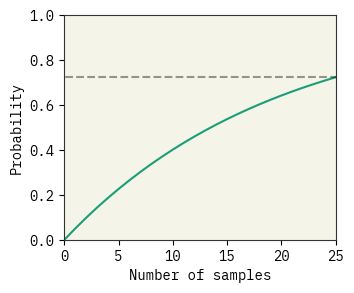

0.7233713985647543


In [492]:
from scipy.stats import binom
import matplotlib.pyplot as plt
n = 25
p = (0.05*12000)/12000
k = 0

dist = [1-binom.pmf(k, n, (0.05*12000)/(12000-n)) for n in range(n+1)]
plt.plot(range(n+1), dist)
plt.ylim(0,1)
plt.xlim(0,n)
plt.xlabel("Number of samples")
plt.ylabel("Probability")
plt.plot([-5,n+5], [dist[-1],dist[-1]], '--', color='black', alpha=0.4)
plt.show()
print(dist[-1])

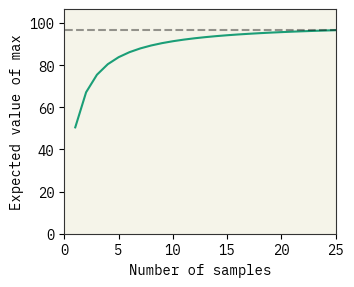

96.63303196611622


In [493]:
# s -> max
# l -> # of samples
# n -> number of classes (percentiles)

def combine(s, l):
  '''Number of combinations of l elements with max = s'''
  return (s**l - (s-1)**(l))

def prob(s, l, n):
  '''Probability of getting a sample with max([x0,x1,...,xl]) = s where xi={0,n}'''
  return combine(s,l) * ((1/n)**l)

def expected_value_p(l, n):
  '''Expected value of max([x0,x1,...,xl]) where xi={0,n}'''
  E = [s * prob(s, l, n) for s in range(1,100+1)]
  return sum(E)

def expected_value_q(l, n, data):
  '''Expected value of max([x0,x1,...,xl]) where xi={0,n}'''
  quants = [data.quantile(i/100) for i in range(100+1)]
  E = [((quants[s-1]+quants[s])/2) * prob(s, l, n) for s in range(1,100+1)]
  return sum(E)

data_path = "./paper/data/C2_yield_meth_oxy_short.csv"
raw_data = pd.read_csv(data_path)

l = 25
dist = [expected_value_p(li, 100) for li in range(1,l+1)]
# dist = [expected_value_q(li, 100, raw_data['completion']) for li in range(1,l+1)]
plt.plot(range(1,l+1), dist)
plt.ylim(0,max(dist)+10)
plt.xlim(0,l)
plt.xlabel("Number of samples")
plt.ylabel("Expected value of max")
plt.plot([-1,n+1], [dist[-1],dist[-1]], '--', color='black', alpha=0.4)
plt.show()
print(dist[-1])

# Loading results

In [494]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [495]:
df = pd.read_csv("ablation_results.csv", sep=';', encoding="ISO-8859-1")
df.columns
# df.iloc[47600]

Index(['y', 'yhat', 'yprobs', 'data', 'model', 'Temperature', 'k_selected',
       'N_train', 'model_class', 'n_tokens', 'x'],
      dtype='object')

In [496]:
df[df['data']=='iupac-sol'].groupby(['Temperature', 'data', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])


,Temperature,data,k_selected,model_class,N_train,model,0
0,0.05,iupac-sol,0,GPR,1,text-ada-001,354
1,0.05,iupac-sol,0,GPR,5,text-ada-001,177
2,0.05,iupac-sol,0,GPR,10,text-ada-001,177
3,0.05,iupac-sol,0,GPR,25,text-ada-001,177
4,0.05,iupac-sol,0,GPR,50,text-ada-001,177
5,0.05,iupac-sol,0,GPR,100,text-ada-001,177
6,0.05,iupac-sol,0,GPR,200,text-ada-001,177
7,0.05,iupac-sol,0,GPR,500,text-ada-001,177
8,0.05,iupac-sol,0,finetune,50,ada:ft-white-research-laboratory-2023-02-28-19...,201
9,0.05,iupac-sol,0,finetune,100,ada:ft-white-research-laboratory-2023-02-28-19...,355


# Plotting

## templates

In [497]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import log_loss

def mse(y, pred):
  # return np.mean((y-pred)**2)
  return mean_squared_error(y, pred)

def mae(y, pred):
  return mean_absolute_error(y, pred)

def r2(y, pred):
  return r2_score(y, pred)

def corr(y, pred):
  return np.corrcoef(y, pred)[0,1]

def acc(y, pred, threshold):
  acc = sum((abs(pred - y)<threshold))/len(pred)
  return acc

def log_likelihood(y, pred, yprob, eps=0):
  y = np.array(y)
  pred = np.array(pred)
  yprob = np.array(yprob)
  return np.sum(0.5 * ( 2*np.log(yprob**2+eps) + ((y - pred)**2 / (yprob**2+eps)) ))/len(y)

def select_df(df, data, k, T, model, model_class, N):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  q= f"Temperature=={T} and "
  if k != 'any':  
    q+= f"k_selected=={k} and "
  if model != 'any': 
    q+= f"model=='{model}' and "
  q+= f"model_class=='{model_class}' and "
  if N != 'any':
    q+= f"N_train=={N} and "
  q += f"data=='{data}'"

  sel = df.query(q)
  if sel.empty:
    raise ValueError(f"Dataframe is empty for the configuration {config}")
  return sel

In [498]:
def plot_parities(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, axis_name=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  if sum([1 for i in config.values() if i is None]) > 1:
    raise ValueError("Only the property being varied in data_range can me passed as None.")

  if nrows*ncols < len(data_range):
    raise ValueError('''There's not enough space to plat all data in data_range.
    Decrease the size of data_range or increase ncols or nrows.''')

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprob=[]
    ax = axs if ncols*nrows == 1 else axs.flatten()[i]

    df_sel = select_df(df, **config)[:254]

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
      yprob.append(df_sel[df_sel['y']==d]['yprobs'].values)

    yprobs = [yhi.std() if yhi.std()!=0 else ypi.mean() for yhi, ypi in zip(yhat, yprob)]
    # yprobs = [ypi.mean() for ypi in yprob]

    ax.plot(y,y)
    ax.errorbar(y, 
                [yhi.mean() for yhi in yhat], 
                # yerr=[yhi.std() if len(yhi)>1 else max(yprob) for yhi in yhat],
                yerr=yprobs, #[yhi.std() if yhi.std()!=0 else ypi for yhi, ypi in zip(yhat, yprobs)],
                fmt='.', color='gray', alpha=0.4)
    ax.scatter(
        y, [yhi.mean() for yhi in yhat], s=6, alpha=1, color=f"C{i}"
    )
    
    ax.set_title(f"{data_property}={p}")

    lim = (min(y), max(y))

    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"correlation = {corr(y, [yhi.mean() for yhi in yhat]):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"log-likelihood = {log_likelihood(y, [yhi.mean() for yhi in yhat], [yhi.std() if yhi.std()!=0  else max(yprobs) for yhi in yhat], eps=1e-6):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"MAE = {mae(y, [yhi.mean() for yhi in yhat]):.3f}")

    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    ax.set_xlabel(f"measured {axis_name}")
    if (i%ncols==0):
      ax.set_ylabel(f"predicted {axis_name}")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)


In [577]:
def plot_GPR_parities(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, axis_name=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  if sum([1 for i in config.values() if i is None]) > 1:
    raise ValueError("Only the property being varied in data_range can me passed as None.")

  if nrows*ncols < len(data_range):
    raise ValueError('''There's not enough space to plat all data in data_range.
    Decrease the size of data_range or increase ncols or nrows.''')

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprob=[]
    ax = axs if ncols*nrows == 1 else axs.flatten()[i]

    df_sel = select_df(df, **config)[:254]

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
      yprob.append(df_sel[df_sel['y']==d]['yprobs'].values)

    yprobs = [ypi.mean() for ypi in yprob]

    ax.plot(y,y)
    ax.errorbar(y, 
                [yhi.mean() for yhi in yhat], 
                yerr=yprobs,
                fmt='.', color='gray', alpha=0.4)
    ax.scatter(
        y, [yhi.mean() for yhi in yhat], s=6, alpha=1, color=f"C{i}"
    )
    
    ax.set_title(f"{data_property}={p}")

    lim = (min(y), max(y))

    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"correlation = {corr(y, [yhi.mean() for yhi in yhat]):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"log-likelihood = {log_likelihood(y, [yhi.mean() for yhi in yhat], yprobs, eps=1e-6):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"MAE = {mae(y, [yhi.mean() for yhi in yhat]):.3f}")

    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    ax.set_xlabel(f"measured {axis_name}")
    if (i%ncols==0):
      ax.set_ylabel(f"predicted {axis_name}")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)


In [500]:
def plot_ablation(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  MAE_list = []
  r_list = []
  nll_list = []
  prop_list = []
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprobs=[]

    df_sel = select_df(df, **config)

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
    yprobs = [yhi.std() for yhi in yhat]

    r_list.append(corr(y, [yhi.mean() for yhi in yhat]))
    MAE_list.append(mae(y, [yhi.mean() for yhi in yhat]))
    nll_list.append(log_likelihood(y, [yhi.mean() for yhi in yhat], [yhi.std() if len(yhi)>1 else max(yprobs) for yhi in yhat], eps=1e-6))
    prop_list.append(p)

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  
  axs[0].plot(prop_list, MAE_list)
  axs[0].set_xlabel(data_property)
  axs[0].set_ylabel("MAE")
  
  axs[1].plot(prop_list, r_list)
  axs[1].set_xlabel(data_property)
  axs[1].set_ylabel("correlation")

  axs[2].plot(prop_list, nll_list)
  axs[2].set_xlabel(data_property)
  axs[2].set_yscale('log')
  axs[2].set_ylabel("negative log-likelihood")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)

In [501]:
# def plot_ablation(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, out_name=None):
#   config = {'k': k,
#             'T': T,
#             'data': data,
#             'model': model,
#             'model_class': model_class,
#             'N': N,
#             }

#   MAE_mean_list = []
#   MAE_max_list  = []
#   MAE_min_list  = []
#   r_list = []
#   prop_list = []
#   for i, p in enumerate(data_range):
#     MAE_mean = []
#     MAE_max  = []
#     MAE_min  = []
#     config[data_property] = p
#     y=[]
#     yhat=[]

#     df_sel = select_df(df, **config)

#     for d in df_sel['y'].unique():
#       y.append(d)
#       # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
#       yhat.append(df_sel[df_sel['y']==d]['yhat'].values)

#     r_list.append(corr(y, [yhi.mean() for yhi in yhat]))
#     for yi, yhi in zip(y, yhat):
#       maes = np.array([np.abs(yi-yhii) for yhii in yhi])
#       MAE_mean.append(maes.mean())
#       MAE_max.append(maes.max())
#       MAE_min.append(maes.min())
#     MAE_mean_list.append(np.array(MAE_mean).mean())
#     MAE_max_list.append(np.array(MAE_max).mean())
#     MAE_min_list.append(np.array(MAE_min).mean())
#     prop_list.append(p)

#   fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  
#   axs[0].plot(prop_list, MAE_mean_list)
#   axs[0].fill_between(prop_list, MAE_min_list, MAE_max_list, alpha=0.2)
#   axs[0].set_xlabel(data_property)
#   axs[0].set_ylabel("MAE")

#   axs[1].plot(prop_list, r_list)
#   axs[1].set_xlabel(data_property)
#   axs[1].set_ylabel("correlation")

#   plt.tight_layout()
#   # plt.show()
#   if (out_name):
#     plt.savefig(f"figs/{out_name}", dpi=300)

## Paper Figures

In [580]:
def create_sub_ablation(axs, df, lims, data_property, data_range, data=None, k=None, T=None, model=None, model_class=None, N=None):
  #(axs, df_sel, axis_name, lim=[-1,1], color='gray')
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  MAE_list = []
  r_list = []
  nll_list = []
  prop_list = []
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprobs=[]

    df_sel = select_df(df, **config)

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
    yprob = [yhi.std() for yhi in yhat]

    r_list.append(corr(y, [yhi.mean() for yhi in yhat]))
    MAE_list.append(mae(y, [yhi.mean() for yhi in yhat]))
    nll_list.append(log_likelihood(y, [yhi.mean() for yhi in yhat], [yhi.std() if len(yhi)>1 else max(yprob) for yhi in yhat], eps=1e-6))
    prop_list.append(p)

  for ax in axs:
    ax.label_outer()

  axs[0].plot(prop_list, MAE_list)
  # axs[0].set_xlabel(data_property)
  axs[0].set_ylabel("MAE\n\n")
  axs[0].set_ylim(lims[0])
  
  axs[1].plot(prop_list, r_list)
  # axs[1].set_xlabel(data_property)
  axs[1].set_ylabel("r\n")
  axs[1].set_ylim(lims[1])

  axs[2].plot(prop_list, nll_list)
  axs[2].set_xlabel(data_property)
  axs[2].set_yscale('log')
  axs[2].set_ylabel("neg-ll")
  # axs[2].set_ylim(lims[2])
  for ax in axs:
    ax.label_outer()

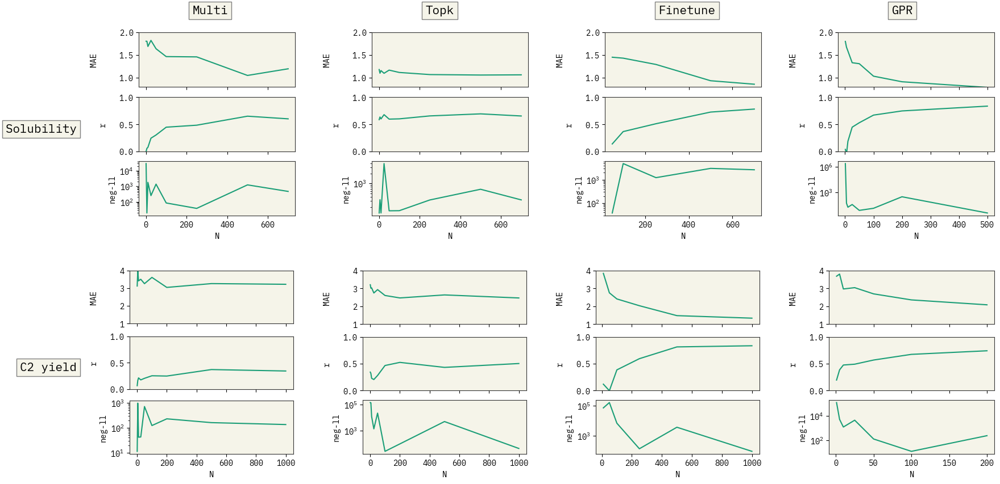

In [584]:
import numpy as np
import matplotlib.pyplot as plt

#figsize=(6.4,4.8)
# fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16,8), constrained_layout=True)
fig = plt.figure(figsize=(16,8), constrained_layout=True)
subfigs = fig.subfigures(2,4, wspace=0.1, hspace=0.1)

sub00 = subfigs[0,0].subplots(3,1, sharex=True, sharey=False)
d00 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='multi', N='any')
lims_sol = [(0.8,2),(0,1),(-1,1)]
create_sub_ablation(sub00, d00, lims_sol, 'N', sorted(d00['N_train'].unique()), data='iupac-sol', k=5, T=0.05, model='text-curie-001', model_class='multi', N=None)

sub01 = subfigs[0,1].subplots(3,1, sharex=True, sharey=False)
d01 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub01, d01, lims_sol, 'N', sorted(d01['N_train'].unique()), data='iupac-sol', k=5, T=0.05, model='text-curie-001', model_class='topk', N=None)

sub02 = subfigs[0,2].subplots(3,1, sharex=True, sharey=False)
d02 = select_df(df, data="iupac-sol", k=0, T=0.05, model='any', model_class='finetune', N='any')
create_sub_ablation(sub02, d02, lims_sol, 'N', sorted(d02['N_train'].unique()), data='iupac-sol', k=0, T=0.05, model='any', model_class='finetune', N=None)

sub03 = subfigs[0,3].subplots(3,1, sharex=True, sharey=False)
d03 = select_df(df, data="iupac-sol", k=0, T=0.05, model='text-ada-001', model_class='GPR', N='any')
create_sub_ablation(sub03, d03, lims_sol, 'N', sorted(d03['N_train'].unique()), data='iupac-sol', k=0, T=0.05, model='text-ada-001', model_class='GPR', N=None)


sub10 = subfigs[1,0].subplots(3,1, sharex=True, sharey=False)
d10 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='multi', N='any')
lims_c2 =  [(1,4),(0,1),(-1,1)]
create_sub_ablation(sub10, d10, lims_c2, 'N', sorted(d10['N_train'].unique()), data='C2', k=5, T=0.05, model='text-curie-001', model_class='multi', N=None)

sub11 = subfigs[1,1].subplots(3,1, sharex=True, sharey=False)
d11 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub11, d11, lims_c2, 'N', sorted(d11['N_train'].unique()), data='C2', k=5, T=0.05, model='text-curie-001', model_class='topk', N=None)

sub12 = subfigs[1,2].subplots(3,1, sharex=True, sharey=False)
d12 = select_df(df, data="C2", k=0, T=0.05, model='any', model_class='finetune', N='any')
create_sub_ablation(sub12, d12, lims_c2, 'N', sorted(d12['N_train'].unique()), data='C2', k=0, T=0.05, model='any', model_class='finetune', N=None)

sub13 = subfigs[1,3].subplots(3,1, sharex=True, sharey=False)
d13 = select_df(df, data="C2", k=0, T=0.05, model='text-ada-001', model_class='GPR', N='any')
create_sub_ablation(sub13, d13, lims_c2, 'N', sorted(d13['N_train'].unique()), data='C2', k=0, T=0.05, model='text-ada-001', model_class='GPR', N=None)

bbox_props = dict(boxstyle="square", fc='#f5f4e9', ec="gray", lw=1)
subfigs[0,0].text(0.5, 1.05, "Multi", ha="left", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
subfigs[0,1].text(0.5, 1.05, "Topk", ha="left", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
subfigs[0,2].text(0.5, 1.05, "Finetune", ha="left", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
subfigs[0,3].text(0.5, 1.05, "GPR", ha="left", va="bottom", rotation=0,
            size=15, bbox=bbox_props)

subfigs[0,0].text(-0.05, 0.5, "Solubility", ha="right", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
subfigs[1,0].text(-0.05, 0.5, "C2 yield", ha="right", va="bottom", rotation=0,
            size=15, bbox=bbox_props)

plt.show()

In [596]:
def create_sub_parity(ax, df_sel, axis_name, lim=[-1,1], color='gray', GPR=False):
    y=[]
    yhat=[]
    yprob=[]
    for d in df_sel['y'].unique():
        y.append(d)
        # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
        yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
        yprob.append(df_sel[df_sel['y']==d]['yprobs'].values)
    yprobs = [yhi.std() for yhi in yhat]
    if GPR:
        yprobs = [ypi.mean() for ypi in yprob]
    
    ax.set_xlabel(f"measured {axis_name}")
    ax.set_ylabel(f"predicted {axis_name}")
    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"correlation = {corr(y, [yhi.mean() for yhi in yhat]):.3f}")
    if GPR:
        ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"log-likelihood = {log_likelihood(y, [yhi.mean() for yhi in yhat], yprobs, eps=1e-6):.3f}")
    else:
        ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"log-likelihood = {log_likelihood(y, [yhi.mean() for yhi in yhat], [yhi.std() if len(yhi)>1 else max(yprob) for yhi in yhat], eps=1e-6):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"MAE = {mae(y, [yhi.mean() for yhi in yhat]):.3f}")

    ax.plot(y,y)
    ax.plot(lim,lim)
    if GPR:
        ax.errorbar(y, 
                    [yhi.mean() for yhi in yhat], 
                    yerr=yprobs,
                    fmt='.', color='gray', alpha=0.3)
    else:  
        ax.errorbar(y, 
                    [yhi.mean() for yhi in yhat], 
                    yerr=[yhi.std() if len(yhi)>1 else max(yprob) for yhi in yhat],
                    fmt='.', color='gray', alpha=0.3)
    ax.scatter(
        y, [yhi.mean() for yhi in yhat], s=6, alpha=1, color=color
    )

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

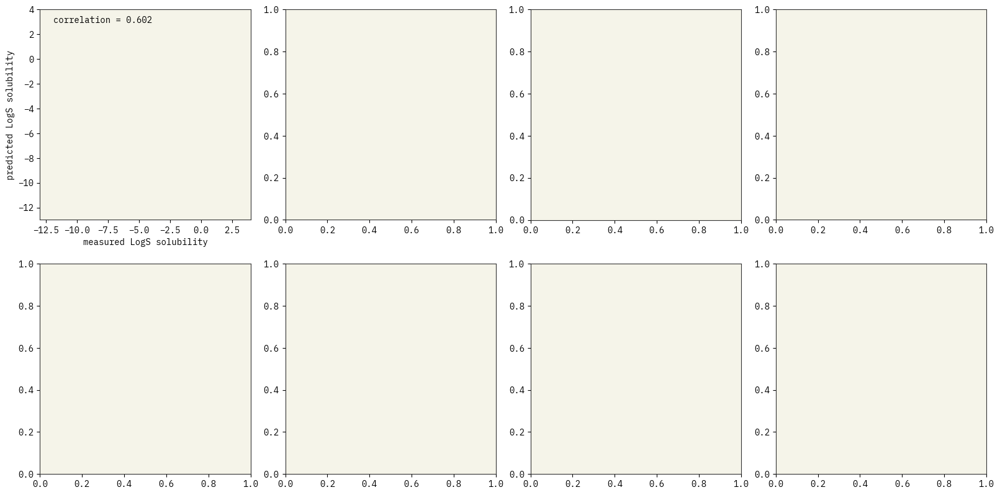

In [597]:
import numpy as np
import matplotlib.pyplot as plt

#figsize=(6.4,4.8)
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(16,8), constrained_layout=True)
for ax in axs.flat:
    ax.set_aspect(1)

# plot axs[0,0]
d00 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='multi', N=700)
lim_sol = (min(d00['y']), max(d00['y']))
lim_sol = (-13,4)
text_anchor = sum(lim_sol)/len(lim_sol)
create_sub_parity(axs[0,0], d00, 'LogS solubility', lim=lim_sol, color=f'C0')
# plot axs[0,1]
d01 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='topk', N=700)
create_sub_parity(axs[0,1], d01, 'LogS solubility', lim=lim_sol, color=f'C1')
# plot axs[0,2]
d02 = select_df(df, data="iupac-sol", k=0, T=0.05, model='any', model_class='finetune', N=700)
create_sub_parity(axs[0,2], d02, 'LogS solubility', lim=lim_sol, color=f'C2')
# plot axs[0,3]
d03 = select_df(df, data="iupac-sol", k=0, T=0.05, model='text-ada-001', model_class='GPR', N=500)
create_sub_parity(axs[0,3], d03, 'LogS solubility', lim=lim_sol, color=f'C3'. GPR=True)

# plot axs[1,0]
d10 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='multi', N=1000)
lim_c2 = (min(d10['y']), max(d10['y']))
lim_c2 = (-2, 25)
create_sub_parity(axs[1,0], d10, 'C2 yield', lim=lim_c2, color=f'C4')
# plot axs[1,1]
d11 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='topk', N=1000)
lim = (min(d11['y']), max(d11['y']))
create_sub_parity(axs[1,1], d11, 'C2 yield', lim=lim_c2, color=f'C5')
# plot axs[1,2]
d12 = select_df(df, data="C2", k=0, T=0.05, model='any', model_class='finetune', N=1000)
lim = (min(d12['y']), max(d12['y']))
create_sub_parity(axs[1,2], d12, 'C2 yield', lim=lim_c2, color=f'C6')
# plot axs[1,3]
d13 = select_df(df, data="C2", k=0, T=0.05, model='text-ada-001', model_class='GPR', N=200)[:250]
create_sub_parity(axs[1,3], d13, 'C2 yield', lim=lim_c2, color=f'C7', GPR=True)


anchor_x = (lim_sol[1]+lim_sol[0])/2
anchor_y = lim_sol[1] + 1
bbox_props = dict(boxstyle="square", fc='#f5f4e9', ec="gray", lw=1)
axs[0,0].text(anchor_x, anchor_y, "Multi", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
axs[0,1].text(anchor_x, anchor_y, "Topk", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
axs[0,2].text(anchor_x, anchor_y, "Finetune", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
axs[0,3].text(anchor_x, anchor_y, "GPR", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)

axs[0,0].text(lim_sol[0]-5, (lim_sol[1]+lim_sol[0])/2, "Solubility", ha="right", va="center", rotation=0,
            size=15, bbox=bbox_props)
axs[1,0].text(lim_c2[0]-7, (lim_c2[1]+lim_c2[0])/2, "C2 yield", ha="right", va="center", rotation=0,
            size=15, bbox=bbox_props)

plt.show()

## C2

In [506]:
c2_data = df[(df['data'] == 'C2')]
c2_data.groupby(['Temperature', 'data', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,data,k_selected,model_class,N_train,model,0
0,0.05,C2,0,GPR,1,text-ada-001,2542
1,0.05,C2,0,GPR,5,text-ada-001,2542
2,0.05,C2,0,GPR,10,text-ada-001,2542
3,0.05,C2,0,GPR,25,text-ada-001,2542
4,0.05,C2,0,GPR,50,text-ada-001,2542
...,...,...,...,...,...,...,...
66,0.05,C2,5,topk,500,text-curie-001,317
67,0.05,C2,5,topk,1000,text-curie-001,304
68,0.05,C2,5,topk,1000,text-davinci-001,300
69,0.05,C2,5,topk,1000,text-davinci-003,367


### multi

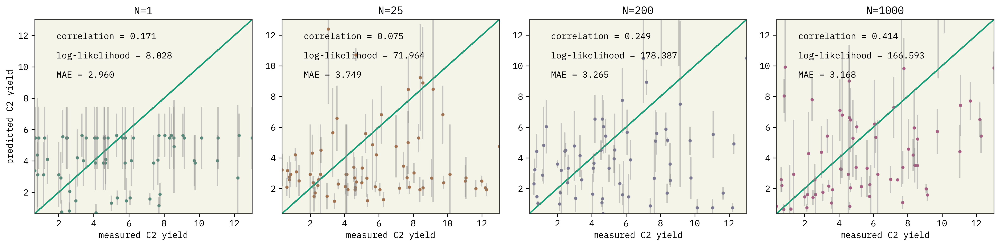

In [543]:
plot_parities(c2_data, 
              'N', 
              [1,25,200,1000],#sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_curie.png")

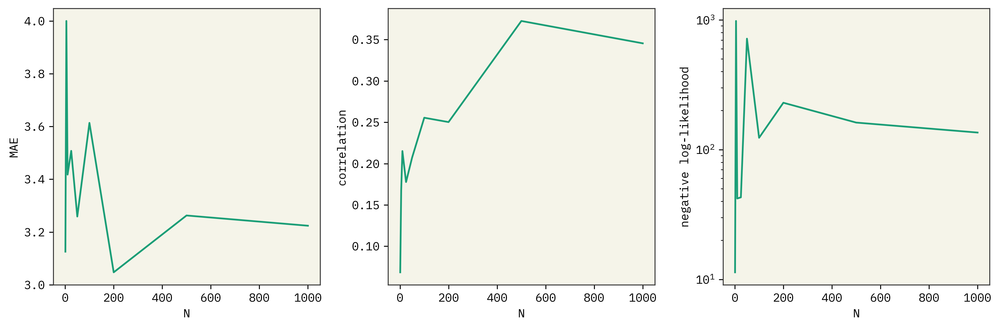

In [544]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              out_name="ablation_C2_multi_N_curie.png")


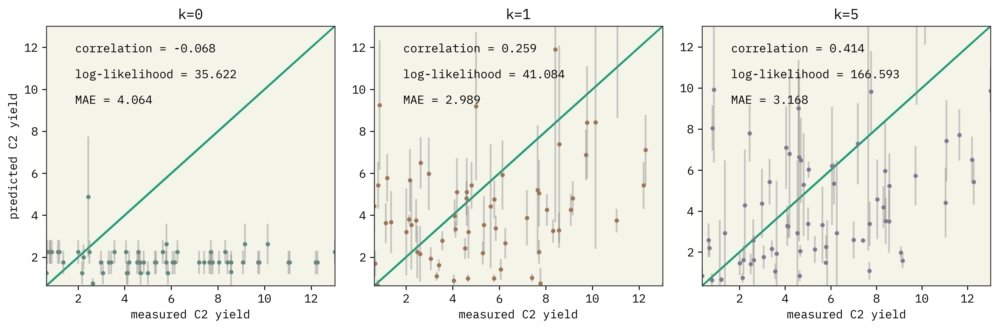

In [545]:
plot_parities(c2_data, 
              'k', 
              [0,1,5], #sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_multi_k_curie.png")

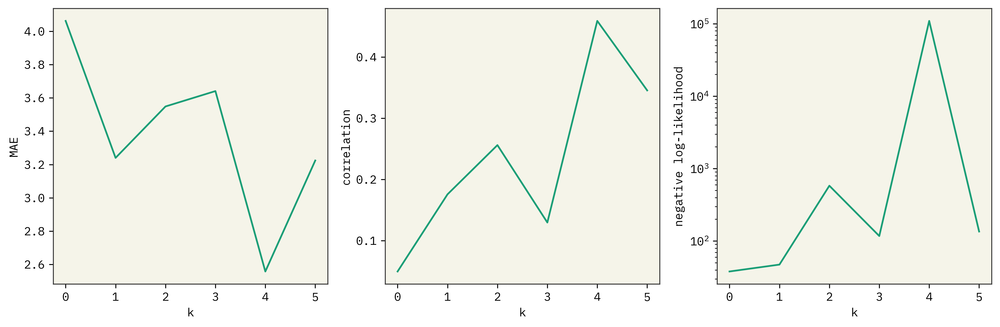

In [546]:
plot_ablation(c2_data, 
              'k', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=1000,
              out_name="ablation_C2_multi_k_curie.png")


### multi-davinvi

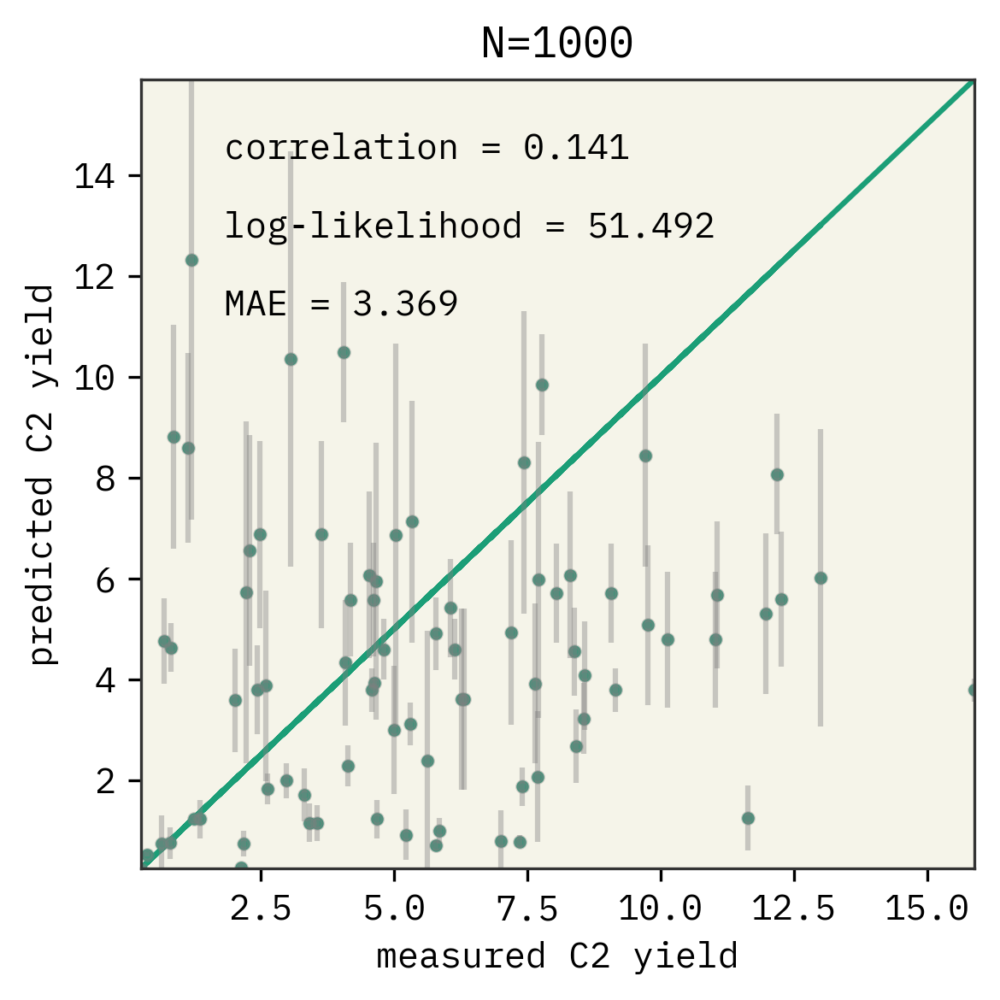

In [542]:
plot_parities(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-003")]['N_train'].unique()), 
              nrows=1, ncols=1,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-davinci-001',
              model_class='multi', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_davinci.png")

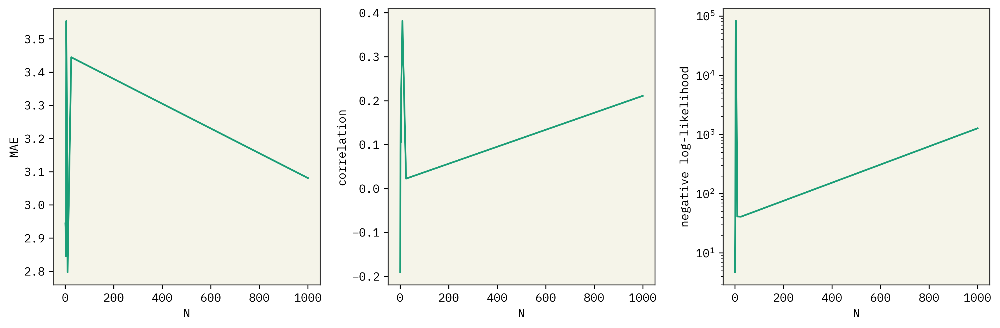

In [512]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-davinci-001',
              model_class='multi',
              N=None,
              out_name="ablation_C2_multi_N_davinci.png")

### topk

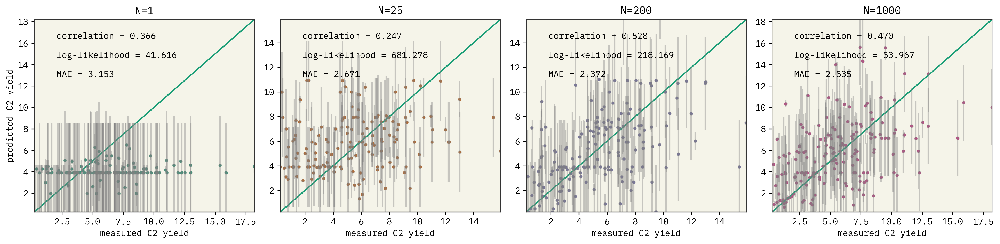

In [547]:
plot_parities(df, 
              'N', 
              [1,25,200,1000], #sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_curie.png")

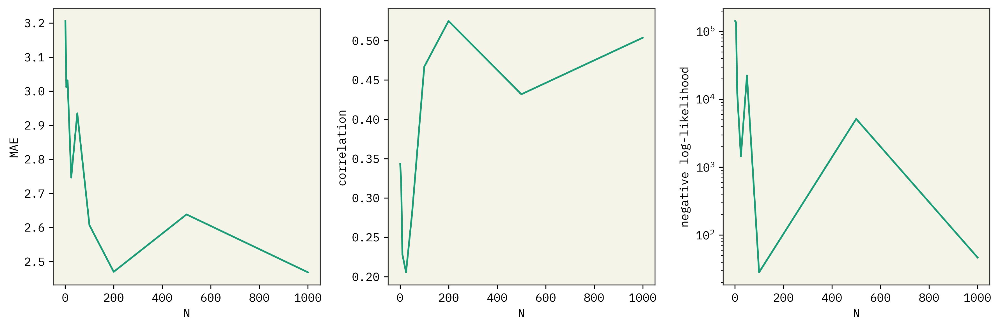

In [548]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=None,
              out_name="ablation_C2_topk_N_curie.png")

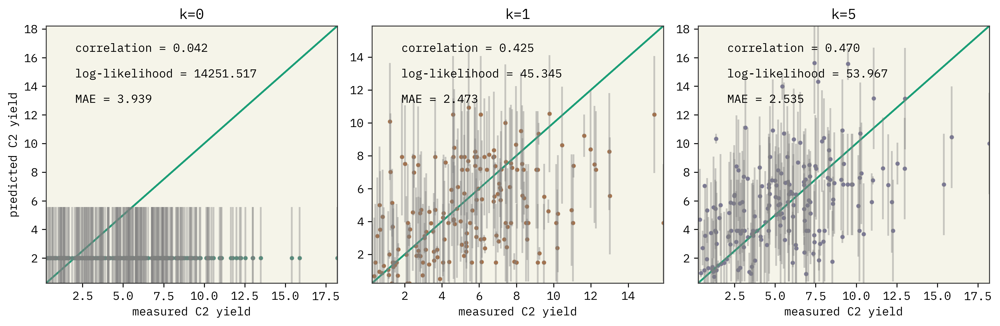

In [549]:
plot_parities(df, 
              'k', 
              [0,1,5], #sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k=None, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_topk_k_curie.png")

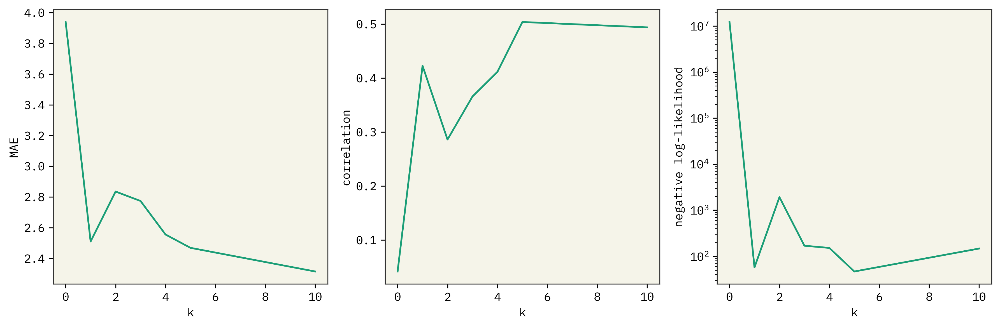

In [550]:
plot_ablation(df, 
              'k', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=1000,
              out_name="ablation_C2_topk_k_curie.png")

### topk-davinci

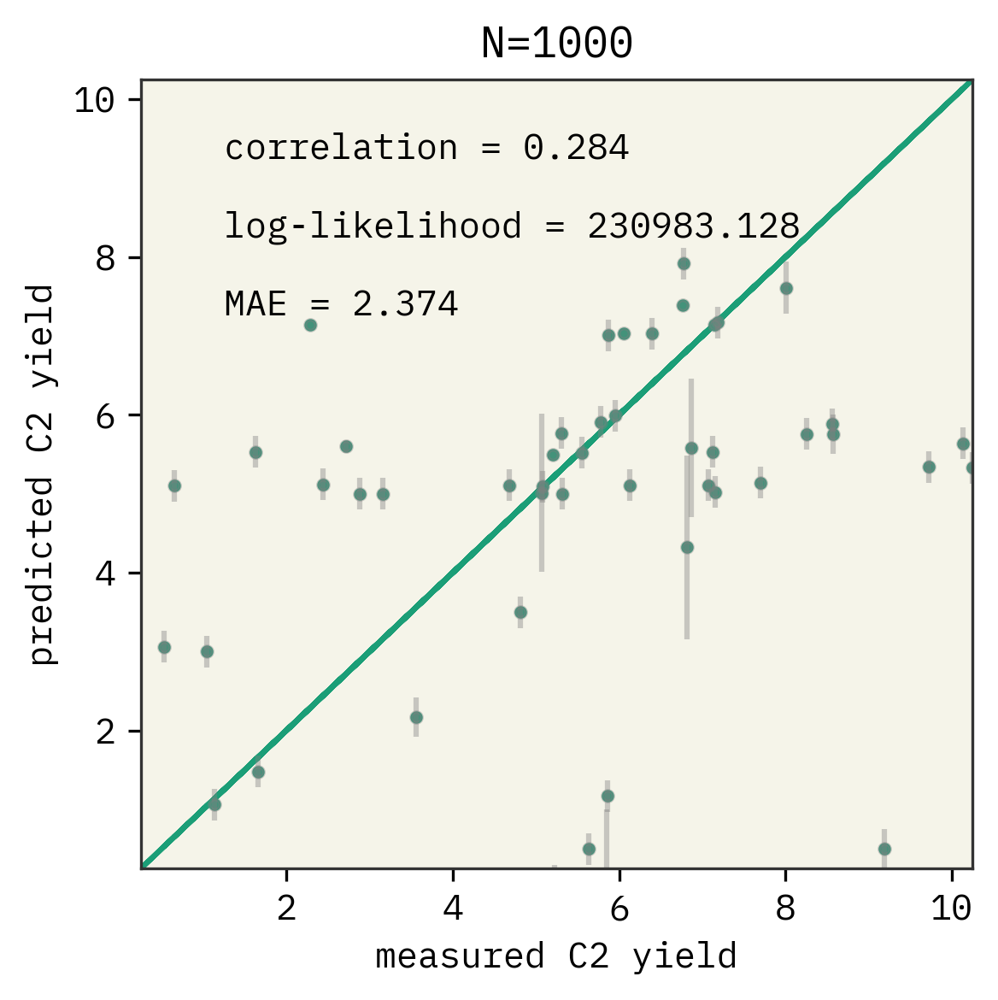

In [573]:
plot_parities(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-003")]['N_train'].unique()), 
              nrows=1, ncols=1,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-davinci-001',
              model_class='topk', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_davinci.png")

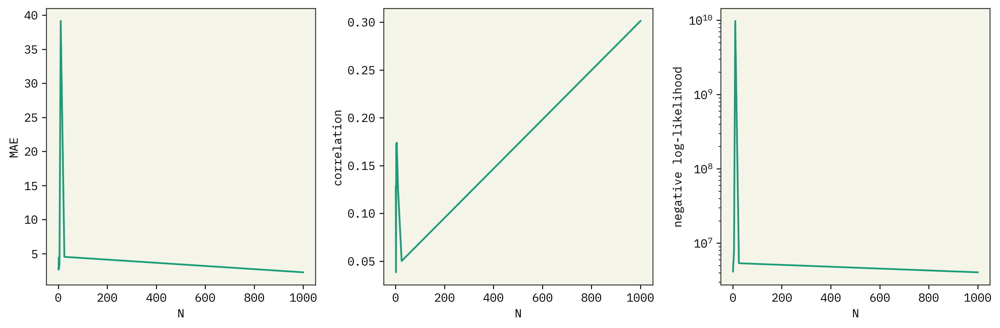

In [518]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-davinci-001',
              model_class='topk',
              N=None,
              out_name="ablation_C2_topk_N_davinci.png")

### GPR

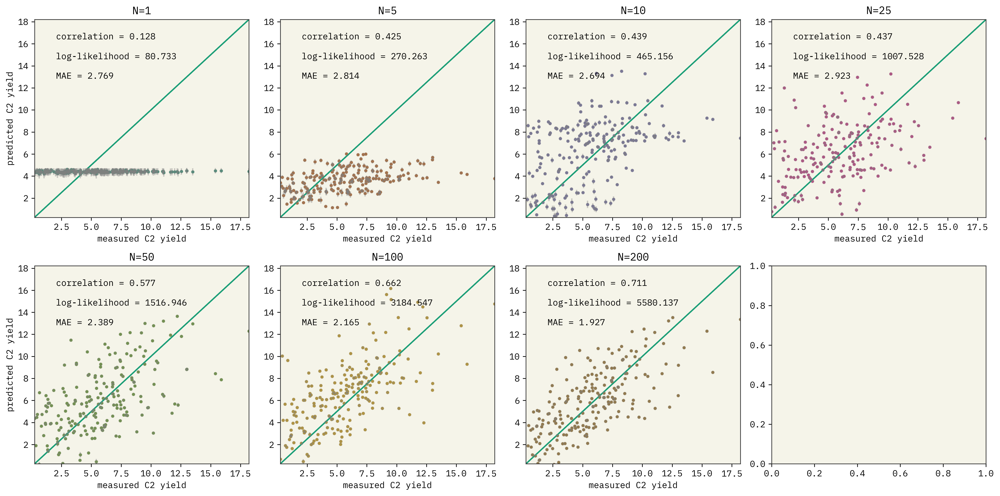

In [579]:
plot_GPR_parities(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="GPR") & (c2_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=2, ncols=4,
              data='C2', 
              k=0, 
              T=0.05, 
              model='text-ada-001', 
              model_class='GPR', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_GPR_N_ada.png")

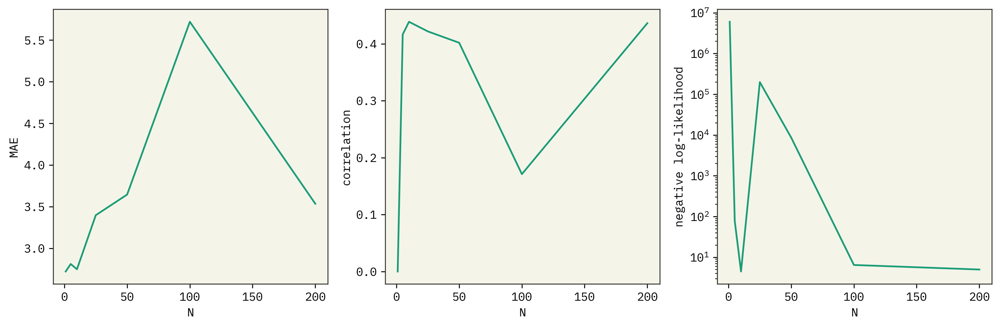

In [521]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="GPR") & (c2_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-ada-001',
              model_class='GPR',
              N=None,
              out_name="ablation_C2_GPR_N_ada.png")

### finetune

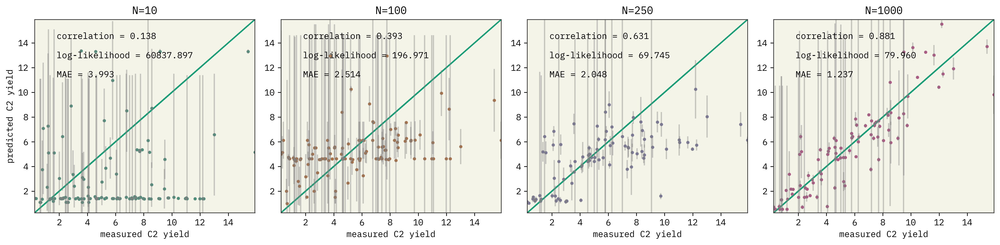

In [522]:
plot_parities(c2_data, 
              'N', 
              [10,100,250,1000], #sorted(c2_data[(c2_data['model_class']=="finetune")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=0, 
              T=0.05, 
              model='any', 
              model_class='finetune', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_FT_N_ada.png")

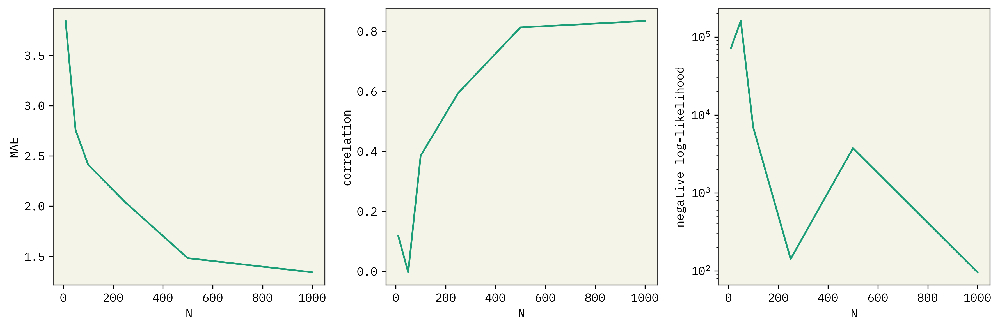

In [523]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="finetune")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=0,
              T=0.05,
              model='any',
              model_class='finetune',
              N=None,
              out_name="ablation_C2_FT_N_ada.png")

### curie X davinci

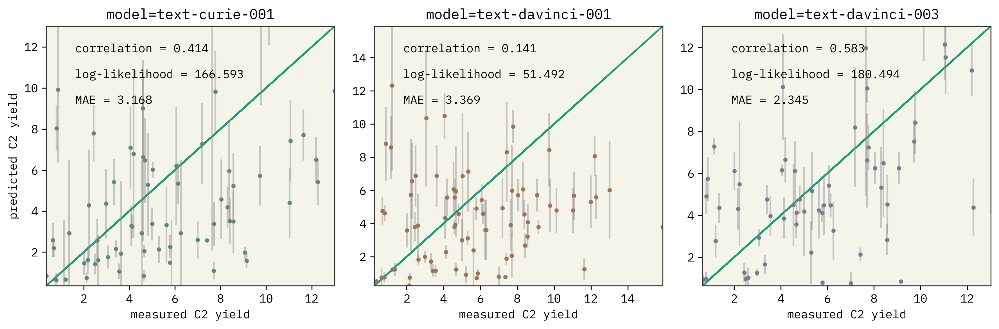

In [524]:
plot_parities(df, 
              'model', 
              sorted(c2_data[c2_data['model_class']=="multi"]['model'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k=5, 
              T=0.05, 
              model=None,
              model_class='multi', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_curieXdavinci.png")

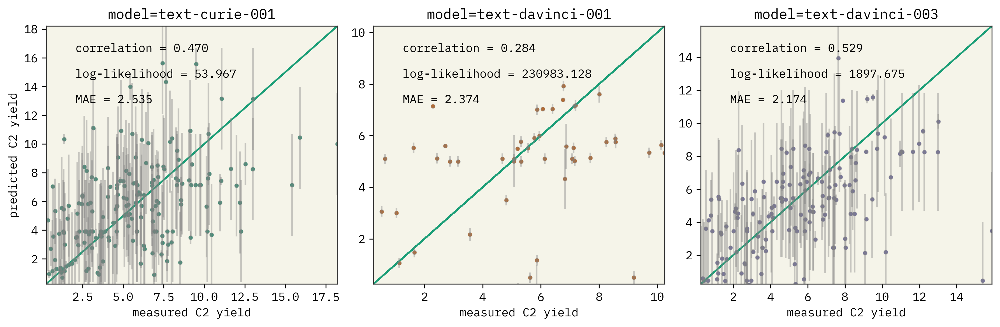

In [525]:
plot_parities(df, 
              'model', 
              sorted(c2_data[c2_data['model_class']=="topk"]['model'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k=5, 
              T=0.05, 
              model=None,
              model_class='topk', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_curieXdavinci.png")

### finetune X multi X topk

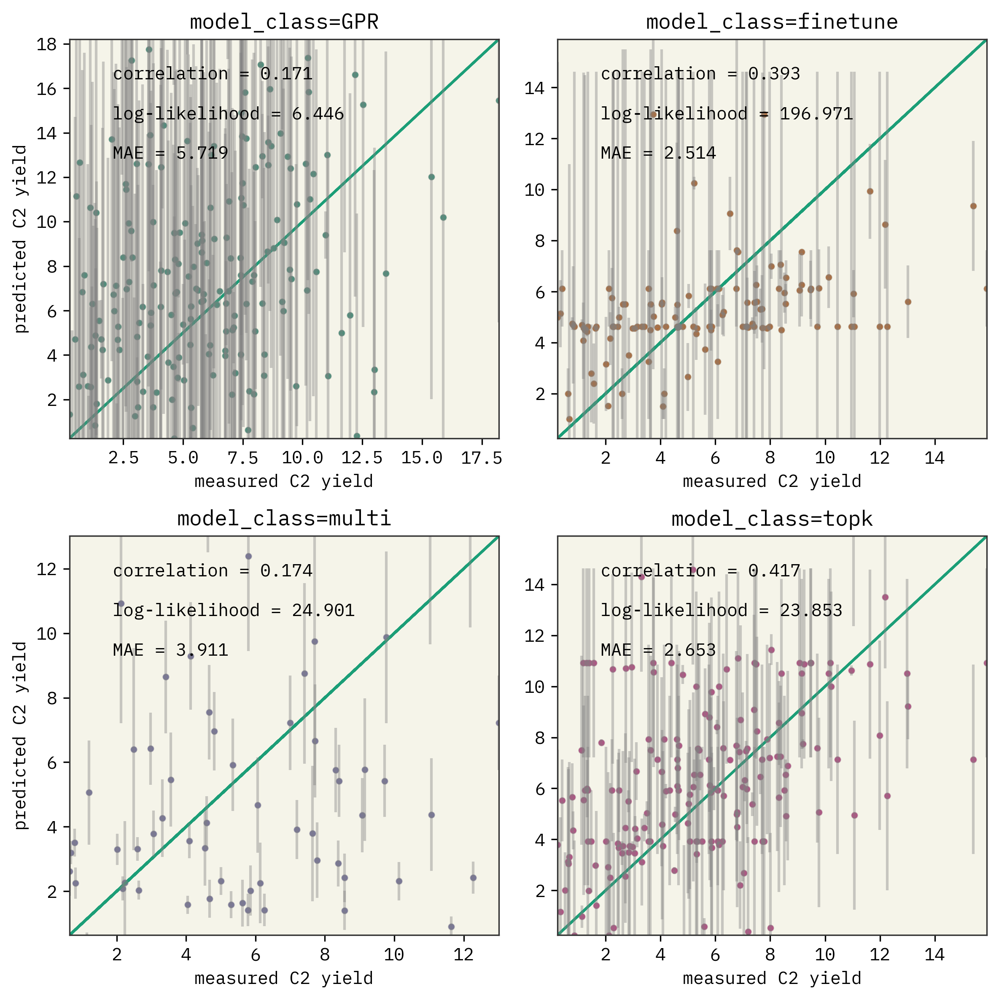

In [526]:
plot_parities(c2_data, 
              'model_class', 
              sorted(c2_data['model_class'].unique()), 
              nrows=2, ncols=2,
              data='C2', 
              k='any',
              T=0.05,
              model='any',
              model_class=1,
              N=100,
              axis_name="C2 yield",
              out_name="par_sol_FT_N_allClasses.png")

## iupac sol

In [527]:
iupac_sol_data = df[(df['data'] == 'iupac-sol')]
iupac_sol_data.groupby(['Temperature', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,k_selected,model_class,N_train,model,0
0,0.05,0,GPR,1,text-ada-001,354
1,0.05,0,GPR,5,text-ada-001,177
2,0.05,0,GPR,10,text-ada-001,177
3,0.05,0,GPR,25,text-ada-001,177
4,0.05,0,GPR,50,text-ada-001,177
5,0.05,0,GPR,100,text-ada-001,177
6,0.05,0,GPR,200,text-ada-001,177
7,0.05,0,GPR,500,text-ada-001,177
8,0.05,0,finetune,50,ada:ft-white-research-laboratory-2023-02-28-19...,201
9,0.05,0,finetune,100,ada:ft-white-research-laboratory-2023-02-28-19...,355


### multi

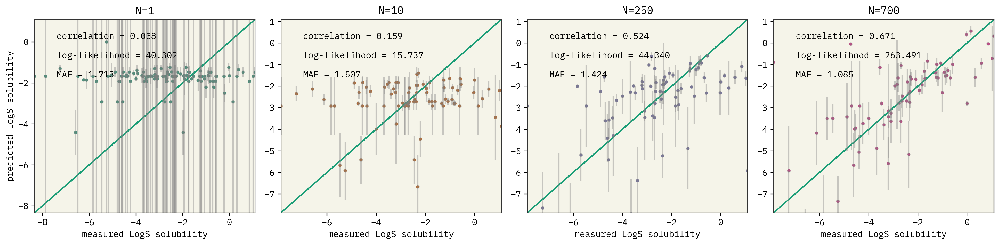

In [560]:
plot_parities(iupac_sol_data, 
              'N', 
              [1,10,250,700], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=5, 
              T=0.05, 
              model='any', 
              model_class='multi', 
              N=None,
              axis_name="LogS solubility",
              out_name="par_sol_multi_N_curie.png")

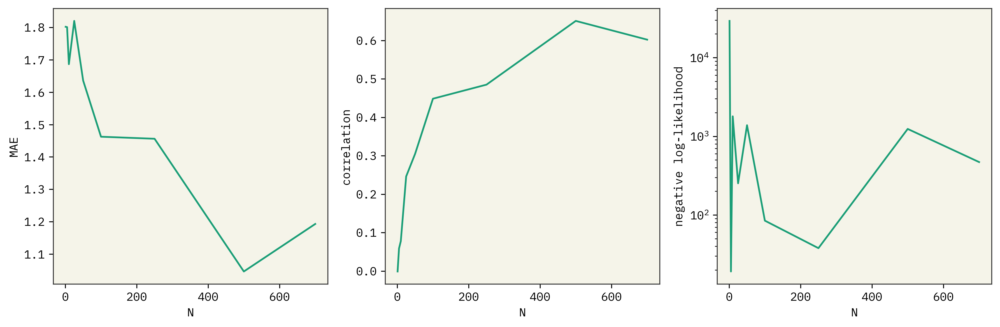

In [561]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              out_name="ablation_sol_multi_N_curie.png")

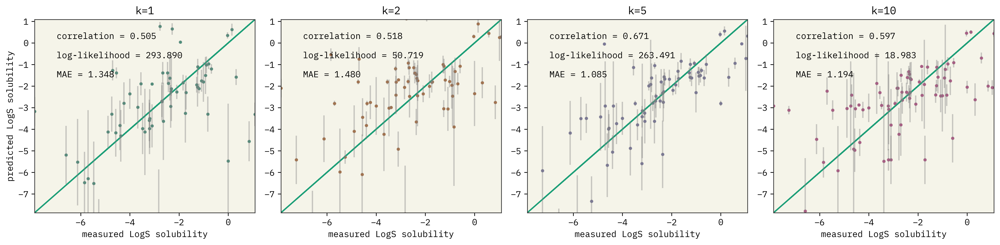

In [562]:
plot_parities(iupac_sol_data, 
              'k', 
              [1,2,5,10], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=None,
              T=0.05, 
              model='text-curie-001',
              model_class='multi', 
              N=700,
              axis_name="LogS solubility",
              out_name="par_sol_multi_k_curie.png")

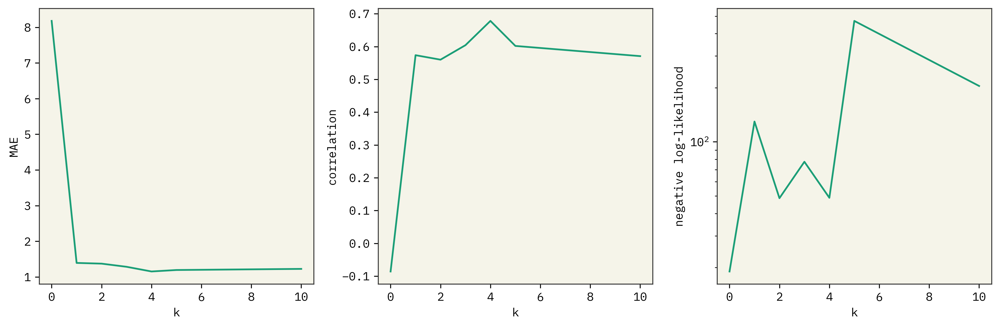

In [563]:
plot_ablation(iupac_sol_data, 
              'k', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=700,
              out_name="ablation_sol_multi_k_curie.png")

### topk

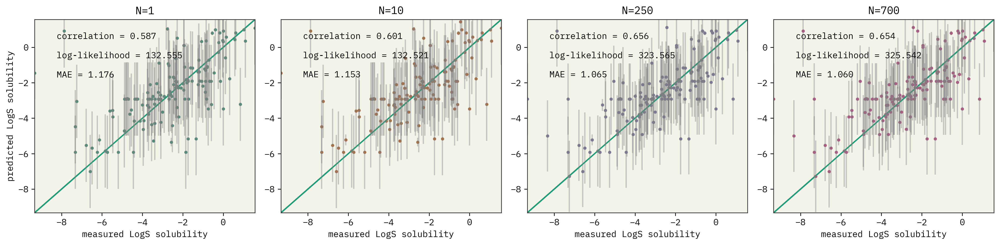

In [568]:
plot_parities(iupac_sol_data, 
              'N', 
              [1,10,250,700], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=5, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk',
              N=None,
              axis_name="LogS solubility",
              out_name="par_sol_topk_N_curie.png")

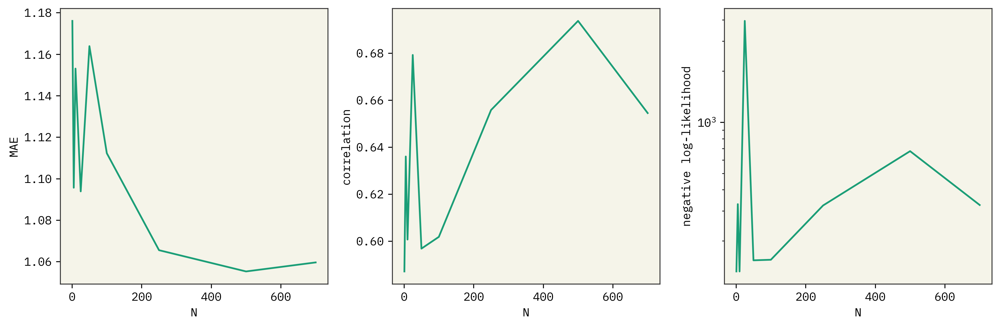

In [569]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=None,
              out_name="ablation_sol_topk_N_curie.png")

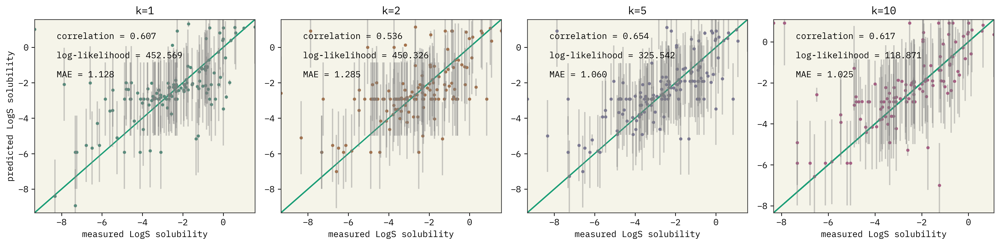

In [572]:
plot_parities(iupac_sol_data, 
              'k', 
              [1,2,5,10], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=None,
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=700,
              axis_name="LogS solubility",
              out_name="par_sol_topk_k_curie.png")

C:\Users\maykc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\function_base.py:2846: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\maykc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\maykc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


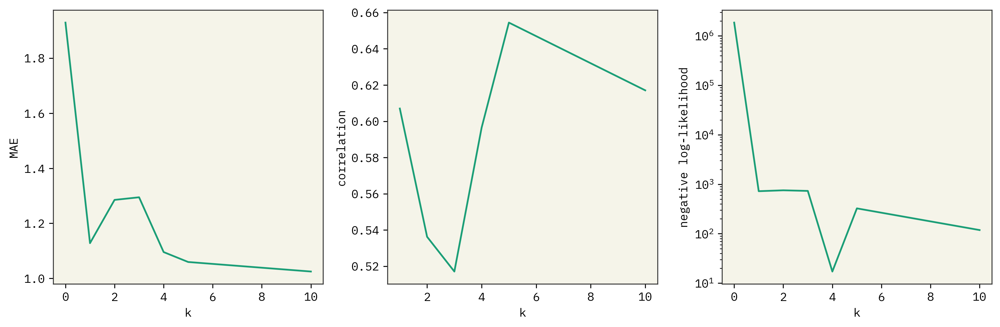

In [571]:
plot_ablation(iupac_sol_data, 
              'k', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=700,
              out_name="ablation_sol_topk_k_curie.png")

### GPR

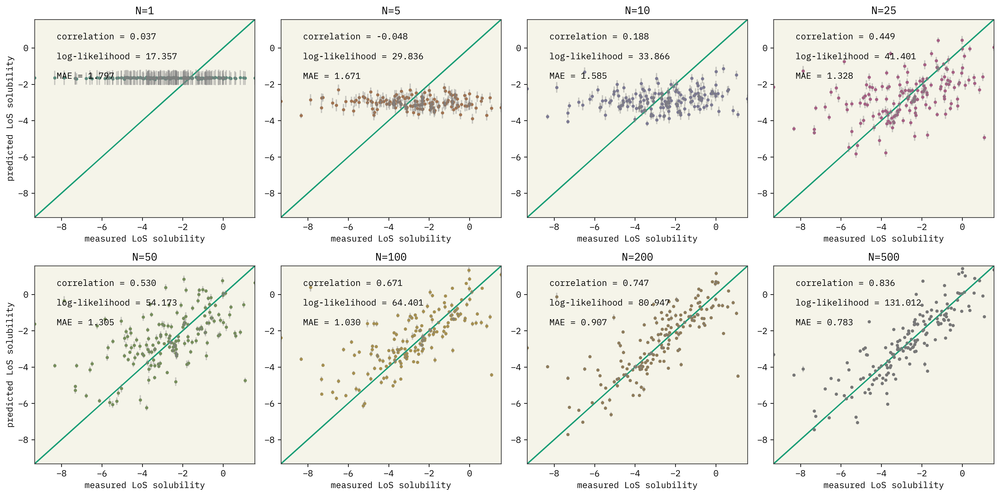

In [578]:
plot_GPR_parities(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[(iupac_sol_data['model_class']=="GPR") & (iupac_sol_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=2, ncols=4,
              data='iupac-sol', 
              k=0, 
              T=0.05, 
              model='text-ada-001', 
              model_class='GPR', 
              N=None,
              axis_name="LoS solubility",
              out_name="par_sol_GPR_N_ada.png")

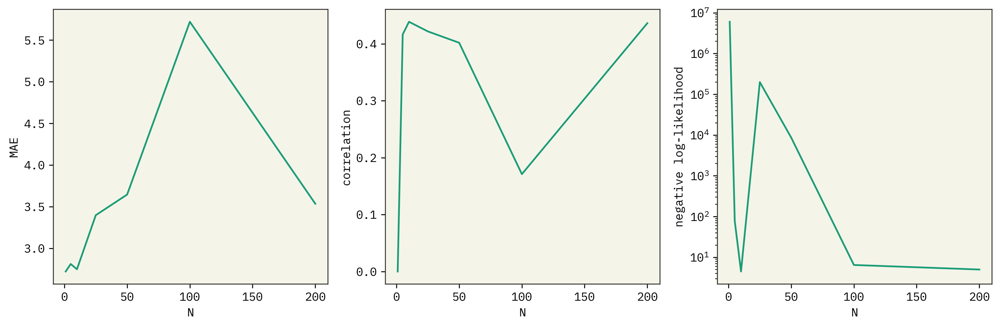

In [537]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="GPR") & (c2_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-ada-001',
              model_class='GPR',
              N=None,
              out_name="ablation_C2_GPR_N_ada.png")

### finetune

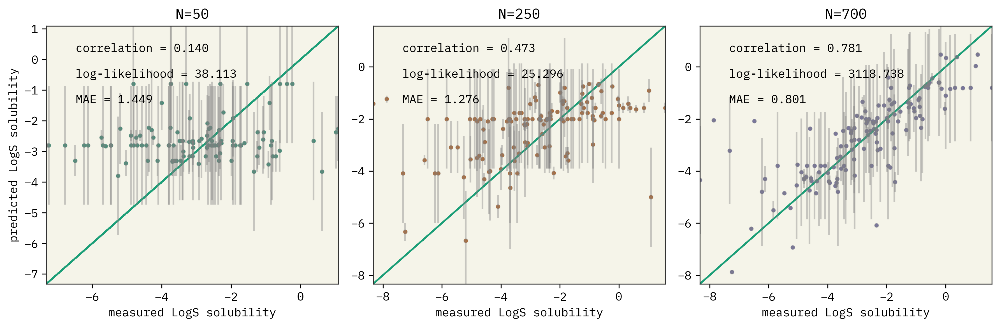

In [538]:
plot_parities(iupac_sol_data, 
              'N', 
              [50, 250, 700],#sorted(iupac_sol_data[iupac_sol_data['model_class']=="finetune"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol', 
              k=0, 
              T=0.05, 
              model='any', 
              model_class='finetune', 
              N=None,
              axis_name="LogS solubility",
              out_name="par_sol_FT_N_ada.png")

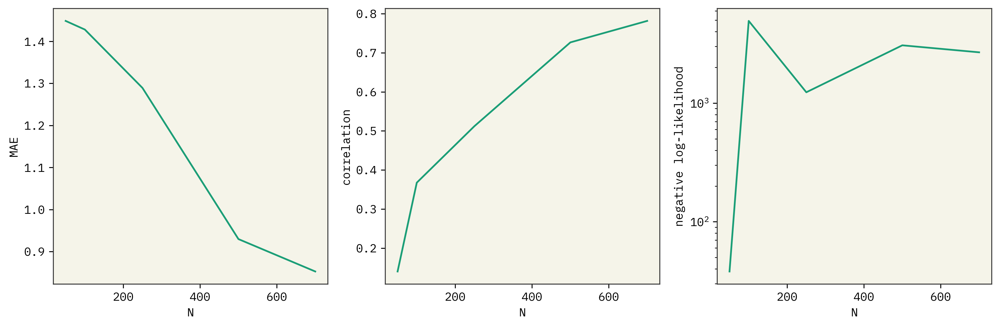

In [539]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="finetune"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=0,
              T=0.05,
              model='any',
              model_class='finetune',
              N=None,
              out_name="ablation_sol_FT_N_ada.png")

### finetune X multi X topk

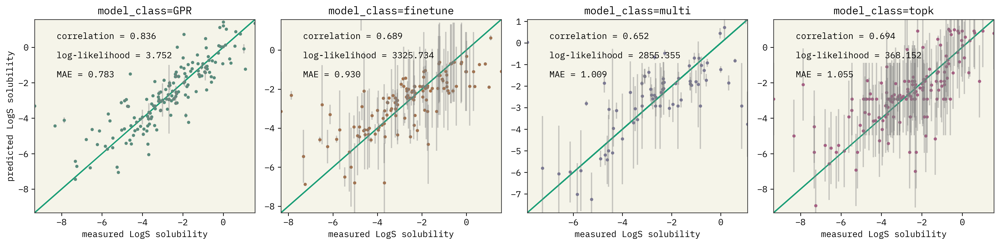

In [540]:
plot_parities(iupac_sol_data, 
              'model_class', 
              sorted(iupac_sol_data['model_class'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k='any',
              T=0.05,
              model='any',
              model_class=None,
              N=500,
              axis_name="LogS solubility",
              out_name="par_sol_allClasses_N.png")

## alloy

In [541]:
alloy_data = df[(df['data'] == 'alloy')]
alloy_data.groupby(['Temperature', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,k_selected,model_class,N_train,model,0
